# 0. Import Packages and environment variables

In [1]:
import os   
import json                                                                       # Provides functions to interact with the operating system, such as reading directories and file paths.
import pandas as pd                                                               # Main library for data manipulation and analysis, offering DataFrame objects and versatile I/O functions.
import numpy as np                                                                # Adds support for large, multi-dimensional arrays and matrices, along with a collection of mathematical functions to operate on these arrays.
import matplotlib.pyplot as plt                                                   # Used for creating static, animated, and interactive visualizations in Python.
import seaborn as sns                                                             # Built on top of matplotlib, used for making statistical graphics and more complex visualizations.
from matplotlib_venn import venn3                                                 # Specifically for creating Venn diagrams for 3 sets, useful for visualizing overlapping data.
import plotly.express as px                                                       # A high-level interface to Plotly, used for creating interactive visualizations.
from scipy import stats                                                           # Contains functions for performing various statistical operations and hypothesis testing.
from sklearn.decomposition import PCA                                             # Used for performing Principal Component Analysis, a dimensionality reduction technique.
from tqdm.auto import tqdm                                                        # Provides a progress bar for loops and iterable processes, enhancing the clarity of long-running operations.
from itertools import combinations                                                # Offers efficient functions to create iterator-based combinations from a dataset.
from utlis.helper_functions import *                                # General helper functions tailored to the project.
from utlis.GOEA import perform_go_analysis, merge_and_plot_heatmap  # Custom functions for Gene Ontology Enrichment Analysis (GOEA) and visualizing results as a heatmap.
from utlis.barplot_GOEA_quartiles import barplot_GOEA_quartiles     # Custom function to generate bar plots for GOEA results, categorized by quartiles.
from utlis.mappings_data_conformer import mappings_data_conformer   # Custom data conformer function specific to mapping datasets.
from utlis.MAPPINGSV1 import process_microarray_data                # Custom function for processing microarray data.

# Suppress pandas SettingWithCopyWarning to prevent unnecessary warnings during chained assignments
pd.options.mode.chained_assignment = None  # This ensures warnings related to chained assignments do not clutter the output.

# Configure Jupyter Notebook to display plots as SVG (Scalable Vector Graphics) for better quality visualizations
%config InlineBackend.figure_format = 'svg'

# Define the local directory path where data files are stored and outputs save to.

# Load the configuration file
with open('config.json', 'r') as config_file:
    config = json.load(config_file)

# Access the paths from the configuration
local_dir = config['local_dir']
output_dir_sheets = config['output_dir_sheets']
output_dir_figures = config['output_dir_figures']

# local_dir = r'C:/Users/Jack/OneDrive - RMIT University/RMIT/Current Lab Projects/SmokeAnalysis/'
# output_dir_sheets = r'C:/Users/Jack/OneDrive - RMIT University/RMIT/Current Lab Projects/SmokeAnalysis/sheets/' 

C:\Users\Jack\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# 1. Dataset Processing & Transformations

### 1.1. Melt the datasets into a single table

In [2]:
# Load the 'antibody revised.csv' file
antibody_to_uniprot = pd.read_csv(os.path.join(output_dir_sheets, 'antibody revised.csv'))

# Load the 'CombinedArrays.xlsx' file for metadata and data
metadata = pd.read_excel(os.path.join(output_dir_sheets, 'CombinedArrays.xlsx'), sheet_name='metadata')
data = pd.read_excel(os.path.join(output_dir_sheets, 'CombinedArrays.xlsx'), sheet_name='data')

In [3]:
# Perform the custom melt operation
first_melt = custom_melt(data)

# Ensure that the 'Barcode' column is a string for the merge
metadata['Barcode'] = metadata['Barcode'].astype(str)

# Merge metadata and first_melt on 'Barcode' and 'id', drop the 'id' column after merging
melted = metadata.merge(first_melt, how='inner', left_on='Barcode', right_on='id').drop(columns=['id'])

melted.to_csv(output_dir_sheets + 'melted.csv', index=False)

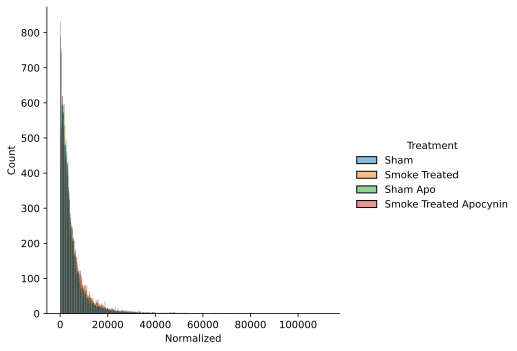

In [4]:
exp_cols = ['Treatment']

sns.displot(melted, x='Normalized', hue='Treatment', log_scale=(False, False))

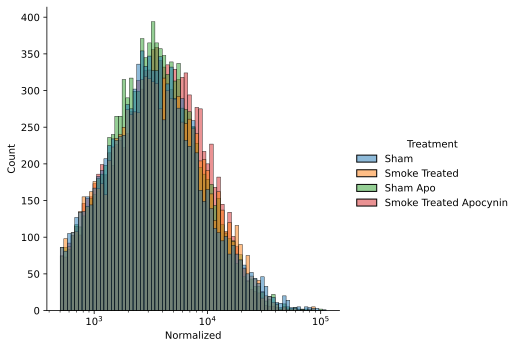

In [5]:
sns.displot(melted[melted['Normalized'] > 500], x='Normalized', hue='Treatment', log_scale=(True, False))

### 1.2. Filter out Pan Specific Signals

In [6]:
antibody_to_uniprot_mergeable = antibody_to_uniprot[['Antibody Code', 'Target Name', 'Target Uniprot ID', 'Pan or P-Site']]

# Merge the 'melted' DataFrame with 'antibody_to_uniprot_mergeable'
# Merge on 'antibody' from 'melted' and 'Antibody Code' from 'antibody_to_uniprot_mergeable'
# Use a left join to keep all rows from 'melted' and add matching data from 'antibody_to_uniprot_mergeable'
# After merging, drop the redundant 'Antibody Code' column
merged = pd.merge(
    melted,
    antibody_to_uniprot_mergeable,
    left_on='antibody',
    right_on='Antibody Code',
    how='left'
).drop(columns=['Antibody Code'])

# Fill missing values in 'Pan or P-Site' with 'Pan-specific'
merged['Pan or P-Site'] = merged['Pan or P-Site'].fillna('Pan-specific')

# Create a new column 'Title' by concatenating 'Target Name' and 'Pan or P-Site'
merged['Title'] = merged['Target Name'] + ' ' + merged['Pan or P-Site']

# Create a boolean column 'isPan' to identify pan-specific antibodies
merged['isPan'] = merged['Pan or P-Site'].str.lower().str.contains('pan')

# Create a deep copy of 'merged' to 'melted_original' to prevent changes from affecting the original DataFrame
melted_original = merged.copy(deep=True)

# Further filter 'melted_original' to include only rows where 'Flag' equals 0
melted_original = melted_original[melted_original['Flag'] == 0]

melted_original.to_csv(output_dir_sheets + 'merged_data_all.csv', index=False)

# Filter out rows where 'isPan' is True, effectively removing pan-specific antibodies from the dataset
# merged = merged[~merged['isPan']]

### 1.3. Filter non-reliable data points

In [7]:
# Filter the 'merged' DataFrame to include only rows where 'Flag' equals zero - these hve been identified as unreliable in scanning
merged = merged[merged['Flag'] == 0]

# Further filter the DataFrame to include only rows with 'Normalized' values greater than 500 - Signals below this intensity are unreliable
merged = merged[merged['Normalized'] > 500]

merged.to_csv(output_dir_sheets + 'cleaned_merged_data.csv', index=False)

# 2. Exploratory Data Analysis

### 2.1. Volcano Plots


In [8]:
merged = pd.read_csv(os.path.join(output_dir_sheets, 'cleaned_merged_data.csv'))

In [9]:
# Split the 'merged' DataFrame into groups based on the 'Treatment' column
group_cols = ['Treatment']
groups = {i: G for i, G in merged.groupby(group_cols)}

# Use only the antibodies that are common across all groups
# Ensure that each antibody has at least 3 measurements in each group
# This is necessary for reliable statistical analysis (e.g., to compute a median or perform t-tests)

# Create a list of sets, where each set contains antibodies with at least 3 measurements in a group
valid_antibodies = [
    set(
        group['antibody']
        .value_counts()                              # Count occurrences of each antibody in the group
        [group['antibody'].value_counts() >= 3]      # Filter antibodies that appear at least 3 times
        .index                                       # Get the antibody names (indices)
    )
    for group in groups.values()                     # Iterate over each group's DataFrame
]

# Find the intersection of antibodies across all groups
# This results in antibodies that have at least 3 measurements in every group
intersecting_antibodies = set.intersection(*valid_antibodies)

# Filter each group's DataFrame to include only the intersecting antibodies
groups = {
    i: G[G['antibody'].isin(intersecting_antibodies)]  # Keep rows with antibodies in the intersection set
    for i, G in groups.items()                         # Iterate over each group
}


In [10]:
# Generate all possible pairs of group keys (treatments) for comparison
combination_keys = list(tuple(x) for x in combinations(groups.keys(), 2))

# Sort each pair in reverse order to ensure the untreated or control group is first
combination_keys = [tuple(sorted(key, reverse=True)) for key in combination_keys]  # Put untreated in the front

# Perform comparisons for each pair of groups
comparisons = {
    key_pair: make_fc(
        groups[list(key_pair)[0]],  # Base group (e.g., control)
        groups[list(key_pair)[1]]   # Experimental group
    )
    for key_pair in tqdm(combination_keys)
}

# Flip the fold changes to create symmetric comparisons
# This ensures that comparisons are available in both directions
symmetric_comparisons = {}

for key_pair, df in comparisons.items():
    # Create a new key by swapping the order of the treatments
    new_key_pair = (key_pair[1], key_pair[0])
    
    # Make a deep copy of the DataFrame to avoid modifying the original
    df = df.copy(deep=True)
    
    # Invert the log2 fold change to represent the comparison in the opposite direction
    df['log2fc'] = -df['log2fc']
    
    # Add the inverted comparison to the symmetric_comparisons dictionary
    symmetric_comparisons[new_key_pair] = df

# Update the original comparisons dictionary with the symmetric comparisons
comparisons.update(symmetric_comparisons)

# Flatten the nested tuples in the dictionary keys
comparisons_flat = {
    (key_a[0], key_b[0]): value
    for (key_a, key_b), value in comparisons.items()
}
comparisons = comparisons_flat

100%|██████████| 6/6 [00:17<00:00,  2.95s/it]


In [11]:
melted_original = pd.read_csv(os.path.join(output_dir_sheets, 'merged_data_all.csv'))

# Split the 'melted_original' DataFrame into groups based on the 'Treatment' column
groups_unfiltered = {i: G for i, G in melted_original.groupby(group_cols)}

# Create a list of sets, where each set contains antibodies with at least 3 measurements in a group
valid_antibodies = [
    set(
        group['antibody']
        .value_counts()
        [group['antibody'].value_counts() >= 3]
        .index
    )
    for group in groups_unfiltered.values()
]

# Find the intersection of antibodies across all groups
intersecting_antibodies = set.intersection(*valid_antibodies)

# Filter each group's DataFrame to include only the intersecting antibodies
groups_unfiltered = {
    i: G[G['antibody'].isin(intersecting_antibodies)]
    for i, G in groups_unfiltered.items()
}

In [12]:
# Generate all possible unique pairs of group keys (treatments) for comparison
combination_keys = list(tuple(x) for x in combinations(groups_unfiltered.keys(), 2))

# Sort each pair in reverse order to ensure the untreated or control group is first
# This standardizes the direction of comparisons (e.g., Control vs. Treatment)
combination_keys = [tuple(sorted(key, reverse=True)) for key in combination_keys]  # Put untreated in the front

# Perform comparisons for each pair of groups using the make_fc function
comparisons_unfiltered = {
    key_pair: make_fc(
        groups_unfiltered[list(key_pair)[0]],  # Base group (e.g., Control)
        groups_unfiltered[list(key_pair)[1]]   # Experimental group
    )
    for key_pair in tqdm(combination_keys)
}

# Flip the fold changes to create symmetric comparisons
symmetric_comparisons_unfiltered = {}

for key_pair, df in comparisons_unfiltered.items():
    # Create a new key by swapping the order of the treatments
    new_key_pair = (key_pair[1], key_pair[0])

    # Make a deep copy of the DataFrame to avoid modifying the original data
    df = df.copy(deep=True)

    # Invert the log2 fold change to represent the comparison in the opposite direction
    df['log2fc'] = -df['log2fc']

    # Add the inverted comparison to the symmetric_comparisons_unfiltered dictionary
    symmetric_comparisons_unfiltered[new_key_pair] = df

# Update the original comparisons_unfiltered dictionary with the symmetric comparisons
comparisons_unfiltered.update(symmetric_comparisons_unfiltered)

# Flatten the nested tuples in the dictionary keys
comparisons_flat = {
    (key_a[0], key_b[0]): value
    for (key_a, key_b), value in comparisons_unfiltered.items()
}
comparisons_unfiltered = comparisons_flat

100%|██████████| 6/6 [00:20<00:00,  3.37s/it]


In [13]:
# Call the function with string keys - use any combination
comparison_volcano(key_a = 'Sham', key_b = 'Smoke Treated', comparisons = comparisons)

In [14]:
# Calculate the min and max values for axes limits
max_fc = max(df['log2fc'].max() for df in comparisons.values())
min_fc = min(df['log2fc'].min() for df in comparisons.values())
max_pval = max(df['pval'].max() for df in comparisons.values())
min_pval = min(df['pval'].min() for df in comparisons.values())

# Create a subplot grid
n = len(groups)
fig, axes = plt.subplots(n, n, figsize=(14, 14), dpi=300)
axes = axes.flatten()

# Get the sorted list of group keys
group_keys = sorted(groups.keys(), reverse=True)

# Iterate through the dictionary and plot the data
for row, key_a in enumerate(group_keys):
    # Extract the string if key_a is a tuple
    if isinstance(key_a, tuple):
        key_a_str = key_a[0]
    else:
        key_a_str = key_a

    for col, key_b in enumerate(group_keys):
        # Extract the string if key_b is a tuple
        if isinstance(key_b, tuple):
            key_b_str = key_b[0]
        else:
            key_b_str = key_b

        name_a = key_a_str
        name_b = key_b_str
        ax = axes[row * n + col]

        # Skip diagonal (same group comparisons)
        if key_a_str == key_b_str:
            ax.axis('off')  # Optionally, turn off the axis for the diagonal
            continue

        # Get the comparison DataFrame
        df = comparisons.get((key_a_str, key_b_str))
        if df is None:
            print(f"Comparison for {key_a_str} vs {key_b_str} not found.")
            ax.axis('off')  # Optionally, turn off the axis if comparison is missing
            continue

        # Filter out pan-specific antibodies
        # df = df[~df['isPan']]

        # Create the scatter plot
        sns.scatterplot(data=df, x='log2fc', y='pval', ax=ax, hue='significant', legend=False, s=5, alpha=0.5)
        ax.text(0.9, 0.9, f"{df['significant'].sum()} sig", ha='right', va='center', transform=ax.transAxes, fontsize=10)
        ax.set_xlim(min_fc, max_fc)
        ax.set_ylim(min_pval, max_pval)
        ax.set_yscale('log')
        ax.invert_yaxis()
        ax.axhline(y=0.05, color='gray', linestyle='--', linewidth=0.5)
        ax.axvline(x=1, color='gray', linestyle='--', linewidth=0.5)
        ax.axvline(x=-1, color='gray', linestyle='--', linewidth=0.5)

        ax.grid(False)
        ax.set_xlabel(None)
        ax.set_ylabel(None)

        # Set y-axis label on the first column
        if col == 0:
            ax.set_ylabel(f'{name_a}\n\nP-Value')
            ax.yaxis.set_label_coords(-0.17, 0.5)  # Adjust the label position
        else:
            ax.set_yticklabels([])

        # Set x-axis label on the last row
        if row == n - 1:
            ax.set_xlabel(f'log2FC\n\n{name_b}')
            ax.xaxis.set_label_coords(0.5, -0.14)
        else:
            ax.set_xticklabels([])

# Adjust subplot spacing
plt.tight_layout()
plt.savefig(output_dir_figures + 'big_volcano.png', dpi=600)

plt.show()

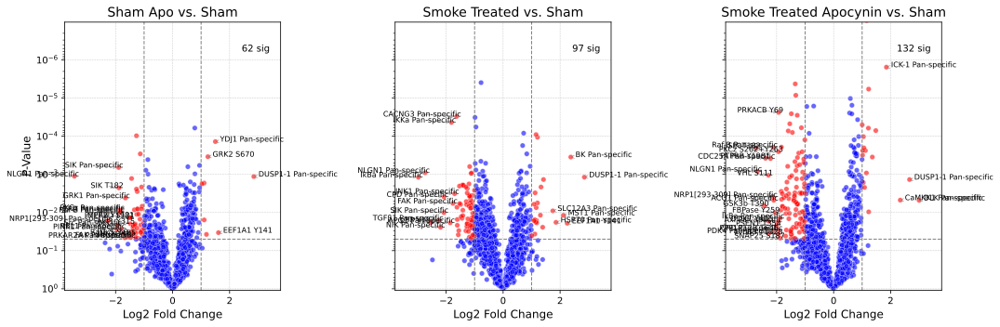

In [15]:
# Calculate the min and max values for axes limits with 10% padding
max_fc = 1.1 * max(df['log2fc'].max() for df in comparisons.values())
min_fc = 1.1 * min(df['log2fc'].min() for df in comparisons.values())
max_pval = 1.1 * max(df['pval'].max() for df in comparisons.values())
min_pval = 1.1 * min(df['pval'].min() for df in comparisons.values())

# Define the comparison keys you want to plot
keys = [
    ('Sham Apo', 'Sham'),
    ('Smoke Treated', 'Sham'),
    ('Smoke Treated Apocynin', 'Sham')
]

# Create a subplot grid with 1 row and 3 columns
n = len(keys)  # Number of comparisons
fig, axes = plt.subplots(1, n, figsize=(15, 5), dpi=300)
axes = axes.flatten()

# Iterate over the comparisons and create plots
for col, key in enumerate(keys):
    key_a, key_b = key  # Unpack the group names
    ax = axes[col]  # Select the corresponding axis

    # Retrieve the comparison DataFrame from the comparisons dictionary
    df = comparisons.get((key_a, key_b))
    if df is None:
        print(f"Comparison for {key_a} vs {key_b} not found.")
        ax.axis('off')  # Turn off the axis if no data is found
        continue

    # Filter out pan-specific antibodies
    # df = df[~df['isPan']]

    # Create a 'Title' column for labeling purposes
    df['Title'] = df['Target Name'].apply(lambda x: x.split(' ')[0]) + ' ' + df['Pan or P-Site']

    # Calculate z-scores for 'log2fc' and 'pval' to identify outliers
    z_scores = df[['log2fc', 'pval']].apply(stats.zscore)

    # Define threshold for considering outliers (z-score > 2.7 corresponds to p < 0.01)
    threshold = 2.7

    # Identify significant outliers based on z-score thresholds and p-value
    df['outlier'] = (
        (df['pval'] < 0.05) & (
            (z_scores['log2fc'] > threshold) |
            (z_scores['log2fc'] < -threshold) |
            (z_scores['pval'] > threshold) |
            (z_scores['pval'] < -threshold)
        )
    )

    # Create the scatter plot using Seaborn
    sns.scatterplot(
        data=df,
        x='log2fc',
        y='pval',
        ax=ax,
        hue='significant',
        palette={True: 'red', False: 'blue'},  # Color mapping for significant points
        legend=False,
        s=30,  # Increased point size for better visibility
        alpha=0.6
    )

    # Annotate the number of significant antibodies on the plot
    ax.text(
        0.95,
        0.9,
        f"{df['significant'].sum()} sig",
        ha='right',
        va='center',
        transform=ax.transAxes,
        fontsize=10,
        bbox=dict(facecolor='white', alpha=0.5, edgecolor='none')
    )

    # Annotate outlier points with their 'Title'
    for i, row in df[df['outlier']].iterrows():
        if row['pval'] > 0.05:
            continue  # Skip if the p-value is not significant
        ax.annotate(
            row['Title'],
            xy=(row['log2fc'], row['pval']),
            xytext=(5, 0),
            textcoords='offset points',
            fontsize=8,
            ha='left' if row['log2fc'] >= 0 else 'right',
            color='black',
            arrowprops=dict(arrowstyle='->', color='gray', linewidth=0.5)
        )

    # Adjust the plot aesthetics
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    ax.set_xlim(min_fc, max_fc)
    ax.set_ylim(min_pval, max_pval)
    ax.set_yscale('log')  # Use logarithmic scale for the y-axis
    ax.invert_yaxis()     # Invert the y-axis to have smaller p-values at the top
    ax.axhline(y=0.05, color='gray', linestyle='--', linewidth=1)  # P-value threshold line
    ax.axvline(x=1, color='gray', linestyle='--', linewidth=1)     # Fold change threshold lines
    ax.axvline(x=-1, color='gray', linestyle='--', linewidth=1)

    # Set axis labels
    ax.set_xlabel('Log2 Fold Change', fontsize=12)
    if col == 0:
        ax.set_ylabel('P-Value', fontsize=12)
    else:
        ax.set_ylabel('')
        ax.set_yticklabels([])  # Hide y-axis labels for other plots

    # Set the title of each subplot to indicate the comparison
    ax.set_title(f'{key_a} vs. {key_b}', fontsize=14)

    # Improve tick label font size
    ax.tick_params(axis='both', which='major', labelsize=10)

# Adjust subplot spacing to prevent overlap
plt.tight_layout()
plt.savefig(output_dir_figures + 'triple_volcano.png', dpi=600, bbox_inches='tight')
plt.show()

In [16]:
# Call the function and display the result - use any combination
get_significant(key_a = 'Sham Apo', key_b = 'Sham', comparisons = comparisons)

,Title,log2fc
Sham Apo vs. Sham,,
0,NLGN1 Pan-specific,-3.45
1,NRP1[293-309] Pan-specific,-2.26
2,PINK1 (BRPK) Pan-specific,-1.96
3,Src Pan-specific,-1.93
4,SIK (SNF1LK) Pan-specific,-1.89
5,SIK (SNF1LK) T182,-1.88
6,CPD Pan-specific,-1.85
7,PKCz (PRKCZ) Pan-specific,-1.85
8,Raf-B (B-Raf; BRaf; RafB) Pan-specific,-1.84


In [17]:
# Create a dictionary to hold all significant comparisons
significant_comparisons = {}

# Iterate over all comparisons in the 'comparisons' dictionary
for (key_a, key_b), comp_df in comparisons.items():
    # Copy the comparison DataFrame to avoid modifying the original
    out_df = comp_df.copy()
    
    # Filter for significant results
    out_df = out_df[out_df['significant']]
    
    # Skip if there are no significant results
    if out_df.empty:
        continue  # Move to the next comparison
    
    # Create a 'Title' column for display
    out_df['Title'] = out_df['Target Name'] + ' ' + out_df['Pan or P-Site']
    
    # Select the columns of interest
    out_df = out_df[['Title', 'log2fc', 'pval']]
    
    # Sort the DataFrame by 'log2fc' values
    out_df = out_df.sort_values('log2fc').reset_index(drop=True)
    
    # Generate a sheet name for the Excel file
    sheet_name = f"{key_a}_vs_{key_b}"
    # Excel sheet names have a maximum length of 31 characters and cannot contain certain characters
    sheet_name = sheet_name.replace(' ', '_')  # Replace spaces with underscores
    sheet_name = sheet_name.replace(':', '_').replace('/', '_').replace('\\', '_')  # Replace invalid characters
    sheet_name = sheet_name[:31]  # Truncate to 31 characters if necessary
    
    # Store the DataFrame in the dictionary with the sheet name as the key
    significant_comparisons[sheet_name] = out_df

# Now write all significant comparisons to an Excel file
output_file = output_dir_sheets + 'significant_comparisons.xlsx'

# Use ExcelWriter to write multiple DataFrames to different sheets
with pd.ExcelWriter(output_file, engine='openpyxl') as writer:
    for sheet_name, df in significant_comparisons.items():
        # Create a Styler object for formatting
        styler = df.style
        
        # Define the styling function
        def make_pretty(styler):
            # Format 'log2fc' and 'pval' columns
            styler = styler.format({'log2fc': "{:.2f}", 'pval': "{:.2e}"})
            # Apply a color gradient to the 'log2fc' column
            styler = styler.background_gradient(subset=['log2fc'], cmap="coolwarm", vmin=-2, vmax=2)
            return styler
        
        # Apply the styling
        styler = make_pretty(styler)
        
        # Write the styled DataFrame to the specified sheet
        styler.to_excel(writer, sheet_name=sheet_name, index=False)

print(f"All significant comparisons have been saved to '{output_file}'.")

All significant comparisons have been saved to './SmokeAnalysis/sheets/significant_comparisons.xlsx'.


In [18]:
# Initialize an empty list to collect modified DataFrames
comps = []

# Iterate over each key-value pair in the 'comparisons' dictionary
for key, df in comparisons.items():
    # Make a copy of the DataFrame to avoid modifying the original data
    df = df.copy()
    
    # Extract the base and experimental group names from the key tuple
    df['base'] = key[0]  # The baseline group
    df['exp'] = key[1]   # The experimental group
    
    # Create a 'Title' column by combining 'Target Name' and 'Pan or P-Site'
    df['Title'] = df['Target Name'] + ' ' + df['Pan or P-Site']
    
    # Create a 'Comparison' column by joining the group names
    df['Comparison'] = " vs. ".join(key)
    
    # Append the modified DataFrame to the 'comps' list
    comps.append(df)

# Concatenate all DataFrames in the 'comps' list into a single DataFrame
comparisons_df = pd.concat(comps, ignore_index=True)

# Create a boolean mask to filter for specific comparisons of interest
comp_experiments = (
    ((comparisons_df['base'] == 'Sham') & (comparisons_df['exp'] == 'Sham Apo')) |
    ((comparisons_df['base'] == 'Sham') & (comparisons_df['exp'] == 'Smoke Treated')) |
    ((comparisons_df['base'] == 'Smoke Treated') & (comparisons_df['exp'] == 'Smoke Treated Apocynin'))
)

In [19]:
melted_original = pd.read_csv(os.path.join(output_dir_sheets, 'merged_data_all.csv'))

def error(series):

    mean = series.mean()
    percent_error = (mean-series).abs()/mean
    return percent_error.mean()

norm_data = melted_original.pivot_table(values=['Normalized'], columns='Treatment', index=['antibody', 'Target Uniprot ID', 'Pan or P-Site'], aggfunc=['mean', 'count', error]).reset_index()
norm_data.columns = norm_data.columns.map(lambda s: " ".join(list(s)).strip())

exp_df = comparisons_df[comp_experiments].copy()
fc_pval_df = exp_df.pivot_table(values=['log2fc', 'pval', 'significant'], columns='Comparison', index=['Target Uniprot ID', 'Pan or P-Site']).reset_index()
fc_pval_df.columns = fc_pval_df.columns.map(lambda s: " ".join(list(s)).strip())

significant_cols = [col for col in fc_pval_df.columns if 'significant' in col]
fc_pval_df[significant_cols] = fc_pval_df[significant_cols].apply(lambda x: (x > 0).astype(int))

fc_pval_df = fc_pval_df.merge(norm_data, on=['Target Uniprot ID', 'Pan or P-Site'], how='outer')

antibody_name_dict = dict(zip(antibody_to_uniprot['Antibody Code'], antibody_to_uniprot['Target Name']))

fc_pval_df['Target Name'] = fc_pval_df['antibody'].map(antibody_name_dict)

fc_pval_df[['antibody','Target Name', 'Target Uniprot ID', 'Pan or P-Site', 'mean Normalized Sham', 'mean Normalized Sham Apo',
           'mean Normalized Smoke Treated', 'mean Normalized Smoke Treated Apocynin', 'error Normalized Sham',
           'error Normalized Sham Apo', 'error Normalized Smoke Treated', 'error Normalized Smoke Treated Apocynin',
           'log2fc Sham vs. Sham Apo', 'log2fc Sham vs. Smoke Treated', 'log2fc Smoke Treated vs. Smoke Treated Apocynin',
           'pval Sham vs. Sham Apo', 'pval Sham vs. Smoke Treated', 'pval Smoke Treated vs. Smoke Treated Apocynin',
           'significant Sham vs. Sham Apo', 'significant Sham vs. Smoke Treated','significant Smoke Treated vs. Smoke Treated Apocynin'
           ]].to_csv(output_dir_sheets + 'non_mappings_data.csv', index=False) 

In [20]:
# Prepare the data
exp_df = comparisons_df[comp_experiments].copy()

# Replace any p-values equal to zero to avoid issues with log scale
exp_df['pval'] = exp_df['pval'].replace(0, 1e-300)

# Compute -log10(p-value) for better visualization
exp_df['-log10_pval'] = -np.log10(exp_df['pval'])

# Create a new column to categorize points based on significance and fold change thresholds
def categorize(row):
    if row['pval'] < 0.05 and row['log2fc'] > 1:
        return 'Upregulated'
    elif row['pval'] < 0.05 and row['log2fc'] < -1:
        return 'Downregulated'
    else:
        return 'Not Significant'

exp_df['Expression'] = exp_df.apply(categorize, axis=1)

# Create a custom marker symbol based on 'Expression'
expression_symbols = {'Upregulated': 'triangle-up', 'Downregulated': 'triangle-down', 'Not Significant': 'circle'}

# Create the scatter plot using Plotly Express
fig = px.scatter(
    exp_df,
    x='log2fc',
    y='-log10_pval',
    color='Comparison',
    symbol='Expression',
    symbol_map=expression_symbols,
    hover_data=['Target Name', 'log2fc', 'pval', 'Comparison'],
    title='Combined Volcano Plot',
    labels={
        'log2fc': 'Log2 Fold Change',
        '-log10_pval': '-Log10 P-value'
    },
    template='plotly_white'
)

# Increase the marker size
fig.update_traces(marker=dict(size=10))

# Add threshold lines for significance and fold change
fig.add_hline(
    y=-np.log10(0.05),
    line_dash="dash",
    line_color="grey",
    annotation_text="p = 0.05",
    annotation_position="bottom left"
)
fig.add_vline(
    x=1,
    line_dash="dash",
    line_color="grey",
    annotation_text="Log2FC = 1",
    annotation_position="top right"
)
fig.add_vline(
    x=-1,
    line_dash="dash",
    line_color="grey",
    annotation_text="Log2FC = -1",
    annotation_position="top left"
)

# Update layout for better aesthetics
fig.update_layout(
    xaxis_title='Log2 Fold Change',
    yaxis_title='-Log10 P-value',
    legend_title='Comparison',
    font=dict(size=12),
    plot_bgcolor='rgba(0,0,0,0)',
    width=1600,  
    height=1000  
)

fig.show()

### 2.2. Matrix Comparisons

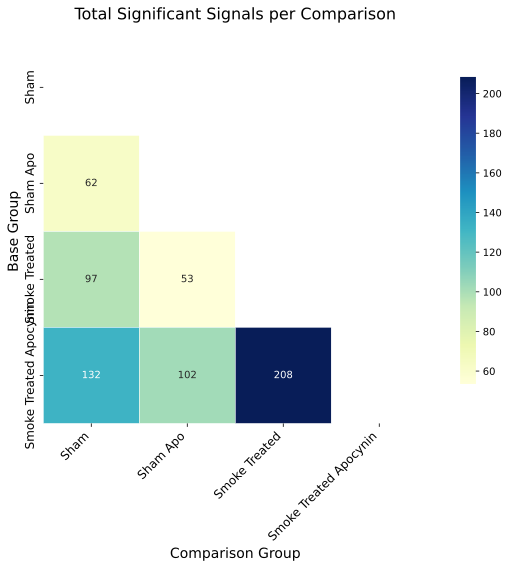

In [21]:
# Get the number of groups
n = len(groups)

# Initialize an n x n matrix to store the counts of significant antibodies
square = np.zeros((n, n))

# Get a list of group keys from the 'groups' dictionary
group_keys = list(groups.keys())

# Extract group names from the keys, handling cases where keys are tuples
names = [key[0] if isinstance(key, tuple) else key for key in group_keys]

# Iterate over each group to compute pairwise comparisons
for i, key_a in enumerate(group_keys):
    # Extract the group name from key_a
    name_a = key_a[0] if isinstance(key_a, tuple) else key_a
    for j, key_b in enumerate(group_keys):
        # Extract the group name from key_b
        name_b = key_b[0] if isinstance(key_b, tuple) else key_b

        # Skip comparisons where the groups are the same
        if i == j:
            square[i][j] = np.nan  # Assign NaN to the diagonal
            continue

        # Use the string names to access the 'comparisons' dictionary
        comparison_key = (name_a, name_b)
        df = comparisons.get(comparison_key)

        if df is None:
            # Try the reverse order if the key is not found
            comparison_key = (name_b, name_a)
            df = comparisons.get(comparison_key)

        if df is None:
            # If still not found, print a message and assign NaN to the matrix
            print(f"Comparison between {name_a} and {name_b} not found.")
            square[i][j] = np.nan  # Assign NaN to indicate missing data
            continue

        # Filter out pan-specific antibodies
        # df = df[~df['isPan']]

        # Count the number of significant antibodies and store it in the matrix
        square[i][j] = df['significant'].sum()

# Create a DataFrame from the matrix with group names as index and columns
square_df = pd.DataFrame(square, index=names, columns=names)

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Generate a mask for the upper triangle (since the matrix is symmetric)
mask = np.triu(np.ones_like(square_df, dtype=bool))

# Define a custom diverging colormap
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Create the heatmap using Seaborn
sns.heatmap(
    square_df,
    mask=mask,                  # Mask the upper triangle
    cmap='YlGnBu',              # Use a visually appealing colormap
    annot=True,                 # Annotate cells with the data values
    fmt='.0f',                  # Format annotations as integers
    linewidths=0.5,             # Add lines between cells
    cbar_kws={"shrink": 0.8},   # Adjust color bar size
    square=True                 # Make cells square-shaped
)

# Customize the plot aesthetics
plt.title('Total Significant Signals per Comparison', fontsize=16, pad=20)
plt.xlabel('Comparison Group', fontsize=14)
plt.ylabel('Base Group', fontsize=14)

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)

# Adjust layout to prevent clipping of tick-labels
plt.tight_layout()

# Display the plot
plt.show()


In [22]:
# Get the number of groups
n = len(groups)

# Initialize an n x n matrix to store the counts of significant antibodies
square = np.zeros((n, n))

# Get a list of group keys from the 'groups' dictionary
group_keys = list(groups.keys())

# Extract group names from the keys, handling cases where keys are tuples
names = [key[0] if isinstance(key, tuple) else key for key in group_keys]

# Iterate over each group to compute pairwise comparisons
for i, key_a in enumerate(group_keys):
    # Extract the group name from key_a
    name_a = key_a[0] if isinstance(key_a, tuple) else key_a
    for j, key_b in enumerate(group_keys):
        # Extract the group name from key_b
        name_b = key_b[0] if isinstance(key_b, tuple) else key_b

        # Skip comparisons where the groups are the same
        if i == j:
            continue

        # Use the string names to access the 'comparisons' dictionary
        comparison_key = (name_a, name_b)
        df = comparisons.get(comparison_key)

        if df is None:
            # Try the reverse order if the key is not found
            comparison_key = (name_b, name_a)
            df = comparisons.get(comparison_key)

        if df is None:
            # If still not found, print a message and assign NaN to the matrix
            print(f"Comparison between {name_a} and {name_b} not found.")
            square[i][j] = np.nan  # Assign NaN to indicate missing data
            continue

        # Filter out pan-specific antibodies
        # df = df[~df['isPan']]

        # Count the number of significant antibodies and store it in the matrix
        square[i][j] = df['significant'].sum()

# Create a DataFrame from the matrix with group names as index and columns
square_df = pd.DataFrame(square, index=names, columns=names)

# Create a heatmap using the data
fig = px.imshow(
    square_df,
    text_auto=True,  # Display the data values in the heatmap cells
    labels=dict(x="Group B", y="Group A", color="Significant Count"),
    x=names,
    y=names,
    title='Total Significant Signals per Comparison'
)

# Update the layout for better visualization
fig.update_layout(
    xaxis_title="Comparison Group",
    yaxis_title="Base Group",
    font=dict(size=12)
)

# Display the heatmap
fig.show()


### 2.3. Venn Diagrams

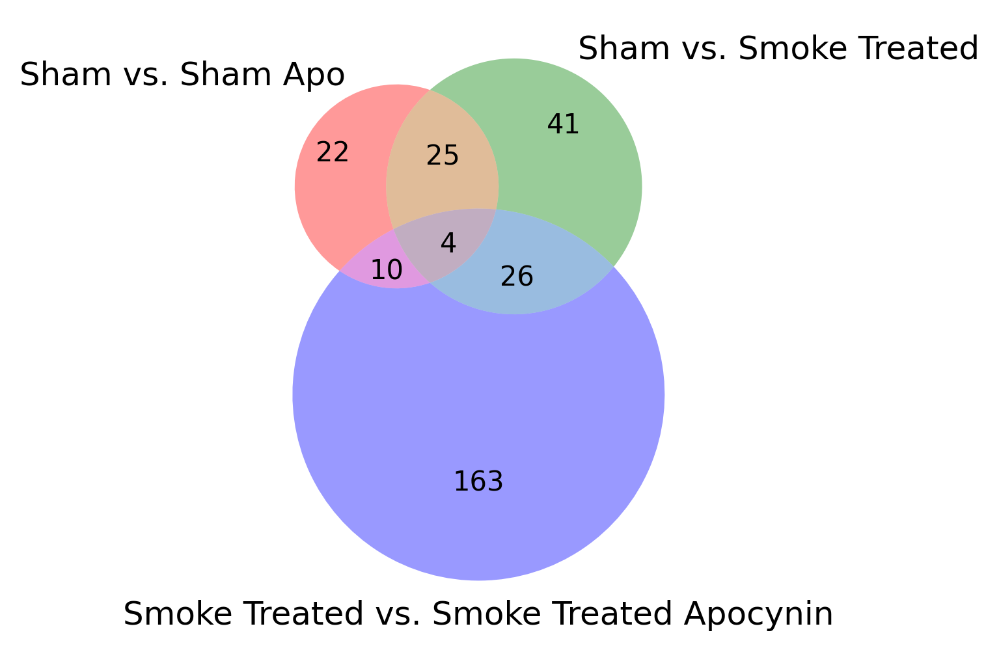

In [23]:
# Define cutoff values for filtering significant results
fc_abs_cutoff = 1       # Absolute fold-change cutoff
pval_cutoff = 0.05      # P-value cutoff

# Define the keys (comparisons) of interest
keys = [
    ('Sham', 'Sham Apo'),
    ('Sham', 'Smoke Treated'),
    ('Smoke Treated', 'Smoke Treated Apocynin')
]

# Apply the significance filter to each comparison DataFrame and store the results in a dictionary
dfs = {key: significance_filter_df(comparisons[key], pval_cutoff = pval_cutoff, fc_abs_cutoff = fc_abs_cutoff) for key in keys}

# Create a dictionary where each key maps to a set of 'Title's (unique antibodies) from the filtered DataFrames
names_sets = {key: set(df['Title']) for key, df in dfs.items()}

%config InlineBackend.figure_format = 'png'  # Set the figure format to 'png'

plt.figure(figsize=(6, 4), dpi=300)
plt.savefig(output_dir_figures + 'venn.png', dpi=600)

# Create a Venn diagram for three sets
venn3(
    list(names_sets.values()),          # List of sets to include in the Venn diagram
    [x[0] + ' vs. ' + x[1] for x in names_sets.keys()]  # Labels for each set
)

In [24]:
get_overlap(
    include=[
        ('Sham', 'Sham Apo'),
        ('Smoke Treated', 'Smoke Treated Apocynin'),
        ('Sham', 'Smoke Treated')
    ],
    exclude=[],
    comparisons = comparisons, 
    pval_cutoff = pval_cutoff, 
    fc_abs_cutoff = fc_abs_cutoff, 
    names_sets = names_sets
)

,,Smoke Treated vs. Smoke Treated Apocynin,Sham vs. Smoke Treated,Sham vs. Sham Apo
Title,,,,
ICK Pan-specific,0,1.68,1.09,1.26
SIK (SNF1LK) Pan-specific,0,-1.05,2.08,1.89
EEF1A1 Y141,0,1.74,-2.25,-1.61
TGFβ1 Pan-specific,0,-1.67,2.26,1.31


In [25]:
makeVenn(key_a = ('Sham', 'Smoke Treated Apocynin'), key_b = ('Sham', 'Smoke Treated'), comparisons = comparisons, pval_cutoff=0.05, fc_abs_cutoff=1.0)

,log2fc
Title,
NMDAR2A NMDA (GRIN2A; Glutamate [NMDA] receptor subunit epsilon-1) Y943,-1.48
ODC1 T93,-1.36
"MKK3 (MAP2K3, MEK3) S218",-1.23
14-3-3e (YWHAE) Pan-specific,-1.23
KCNQ2 Pan-specific,-1.22
PTPN11 (PTP1D; PTP2C; SHP2; SHPTP2; Syp) Y62,-1.16
HMGA1 S36+T39,-1.15
CDK5 Pan-specific,-1.12
AMPKa2 (PRKAA2) Pan-specific,-1.08


### 2.4. Fold Change Plots

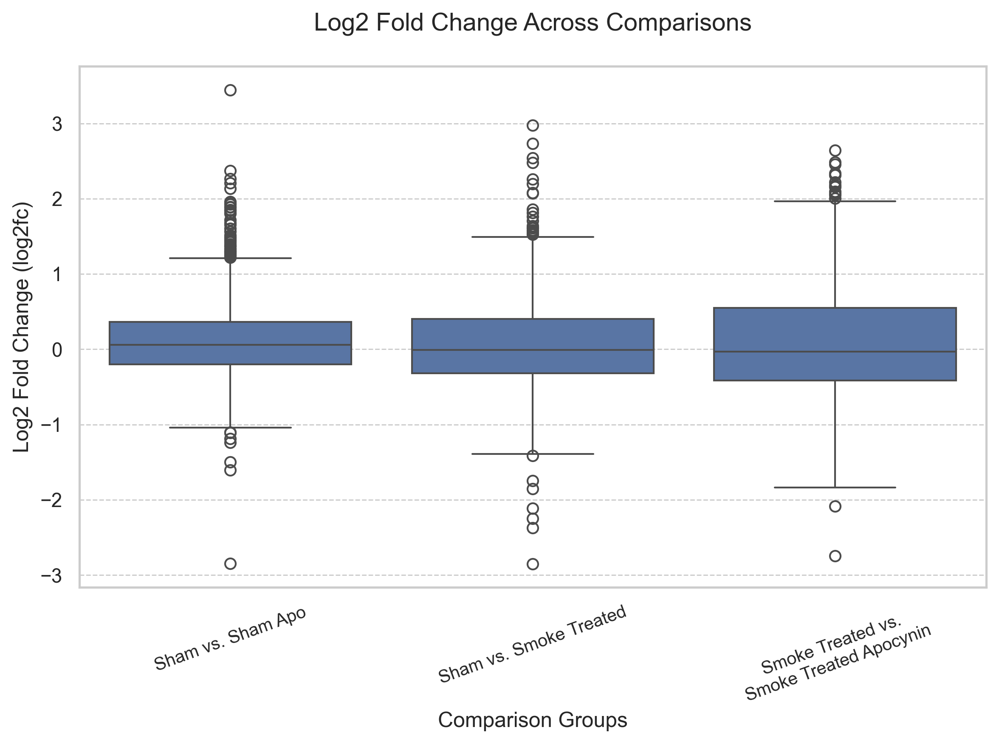

In [26]:
plt.figure(figsize=(8, 6), dpi=300)
sns.set_palette(sns.color_palette("Set2"))
sns.set(style="whitegrid")

# Create the boxplot comparing the log2fc values across different groups
sns.boxplot(data=exp_df, x="Comparison", y="log2fc")

labels = ['Sham vs. Sham Apo', 'Sham vs. Smoke Treated', 'Smoke Treated vs.\nSmoke Treated Apocynin']

# Update the x-axis labels
plt.xticks(range(len(labels)), labels, ha="center", fontsize=10, rotation=20)

plt.ylabel('Log2 Fold Change (log2fc)', fontsize=12)
plt.xlabel('Comparison Groups', fontsize=12)
plt.grid(axis='y', linestyle='--', linewidth=0.7)
plt.title('Log2 Fold Change Across Comparisons', fontsize=14, pad=20)
plt.tight_layout()
plt.show()

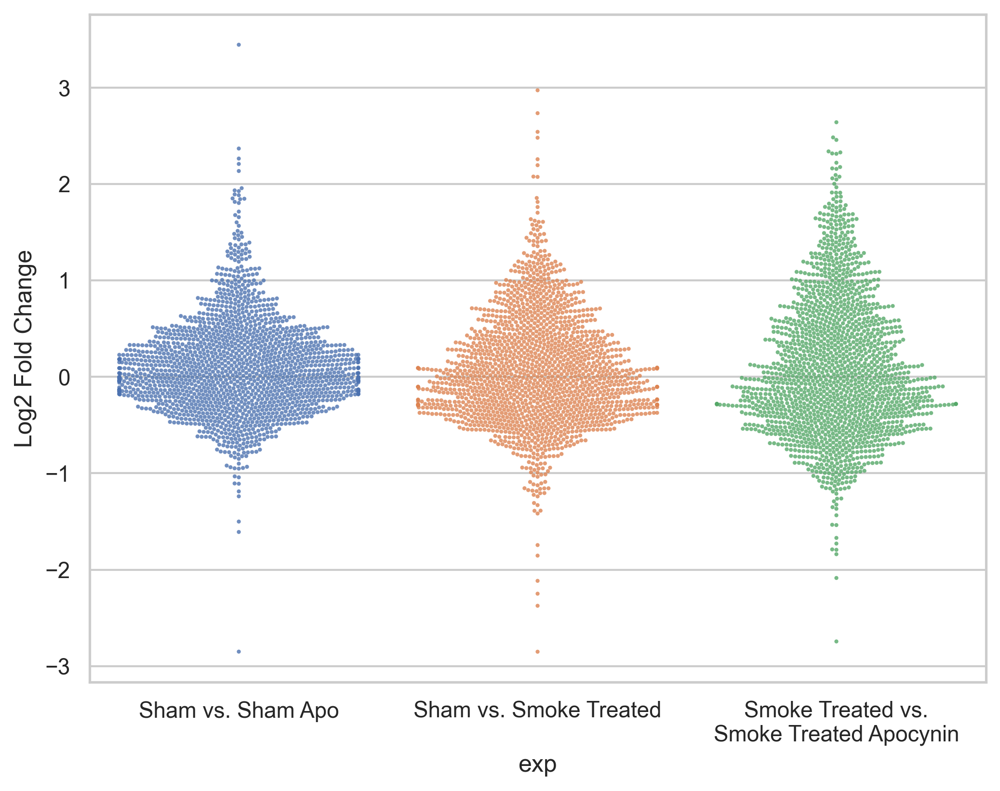

In [27]:
# Create a beautiful bean plot

plt.figure(figsize=(8, 6), dpi=300)
sns.set_palette(sns.color_palette()[1:])
sns.set(style="whitegrid")

sns.swarmplot(data=exp_df, x='exp', hue="exp", y="log2fc", alpha=0.80, s=2, legend=False)
plt.xticks(range(len(labels)), labels, ha="center")

plt.ylabel("Log2 Fold Change")
plt.show()


### 2.5. Correlation and PCA

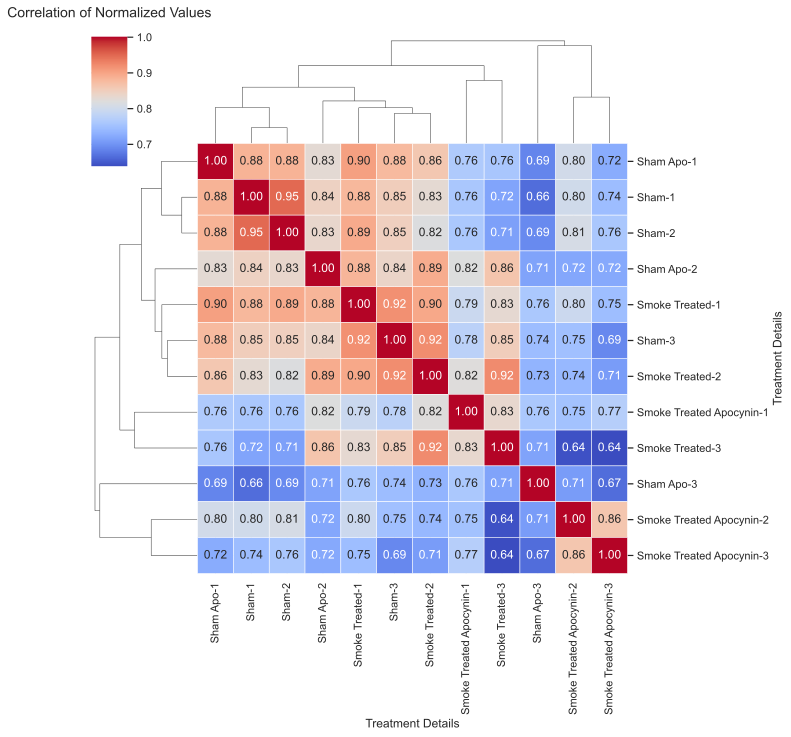

In [28]:
%config InlineBackend.figure_format = 'svg'

# Group by 'Title' and 'Treatment Details' and compute the mean of 'Normalized' values
average_normalised = (
    merged.groupby(['Title', 'Treatment Details'])['Normalized']
    .mean()
    .reset_index()
    .pivot_table(values='Normalized', columns='Treatment Details', index='Title')  # Pivot for easier comparison
)

# The clustermap visualizes the correlation matrix between treatment groups based on normalized values
sns.clustermap(
    average_normalised.corr(),  # Compute correlation between treatment groups
    cmap="coolwarm",            # Use the coolwarm colormap for a balanced color gradient
    annot=True,                 # Annotate the heatmap with the correlation values
    fmt='.2f',                  # Format the annotations to 2 decimal places
    linewidths=0.5,             # Add lines between cells for better distinction
    figsize=(10, 10)              # Adjust the size of the clustermap (clustermap uses this parameter, not plt.figure)
)

plt.title('Correlation of Normalized Values', fontsize=14, pad=20)
plt.savefig(output_dir_figures + 'corr_all.png', dpi=600)
plt.show()


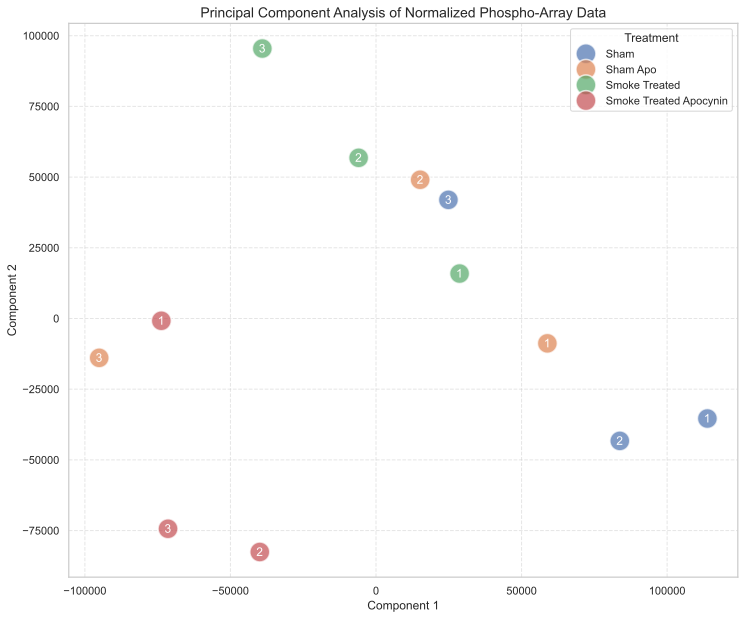

In [29]:
%config InlineBackend.figure_format = 'svg'

# Fit PCA
transformer = PCA(n_components=2)
transformed_result = transformer.fit_transform(average_normalised[~average_normalised.isna().any(axis=1)].T)

# Create a DataFrame for transformed results
transformed_df = pd.DataFrame(transformed_result, columns=['Component 1', 'Component 2'])
transformed_df['name'] = average_normalised.columns
transformed_df['replicate'] = transformed_df['name'].apply(lambda x: x.split('-')[1])
transformed_df['Treatment'] = transformed_df['name'].apply(lambda x: x.split('-')[0])
transformed_df = transformed_df.sort_values('Treatment')

# Create a scatterplot
plt.figure(figsize=(12, 10))  # Set the figure size
sns.set(style="whitegrid")  # Set the style
sns.scatterplot(data=transformed_df, x='Component 1', y='Component 2', s=400, alpha=0.7, hue='Treatment')

# Label points with 'name' slightly off the dots
for i in range(len(transformed_df)):
    plt.text(transformed_df['Component 1'][i]-60, transformed_df['Component 2'][i]-300,
             transformed_df['replicate'][i], fontsize=12, ha='center', va='center', color='white')

# Set plot title and labels
plt.title('Principal Component Analysis of Normalized Phospho-Array Data', fontsize=14)
plt.xlabel('Component 1', fontsize=12)
plt.ylabel('Component 2', fontsize=12)
plt.grid(linestyle='--', alpha=0.5)
plt.savefig(output_dir_figures + 'pca_scatterplot.png', dpi=600)
plt.show()

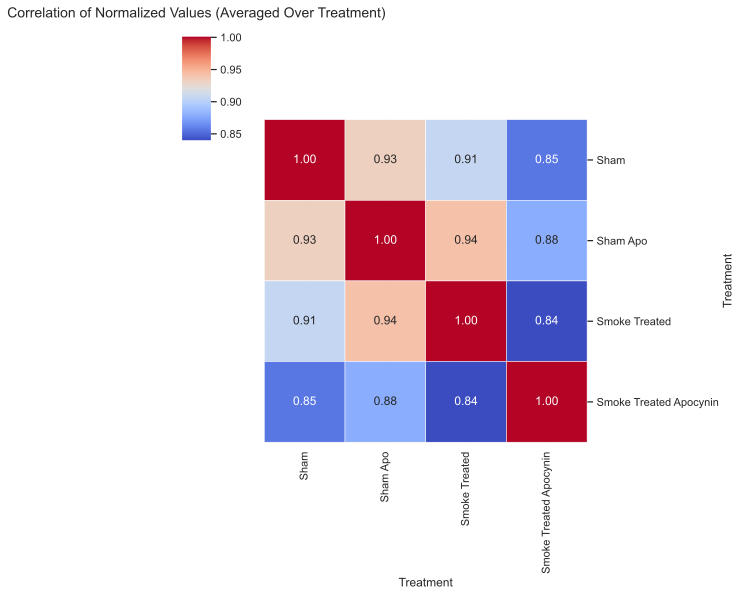

In [30]:
# Group by 'Title' and 'Treatment', then calculate the mean of normalized values
# Pivot the table to create a matrix where rows are 'Title' and columns are 'Treatment'
average_normalised = (
    merged.groupby(['Title', 'Treatment'])['Normalized']
    .mean()
    .reset_index()
    .pivot_table(values='Normalized', columns='Treatment', index='Title')
)

# Create a clustermap using the correlation of average normalized values
clustermap = sns.clustermap(
    average_normalised.corr(),  # Compute correlation between treatment groups
    cmap="coolwarm",            # Use a diverging colormap to distinguish correlations
    annot=True,                 # Annotate each cell with the correlation value
    fmt='.2f',                  # Format annotations to show 2 decimal places
    linewidths=0.5,             # Add small lines between cells for separation
    figsize=(8, 8),             # Set the size of the clustermap
    cbar_kws={"shrink": 0.8},   # Shrink color bar to fit plot
    row_cluster=False,          # Disable row dendrogram
    col_cluster=False           # Disable column dendrogram to keep original order
)

plt.title('Correlation of Normalized Values (Averaged Over Treatment)', fontsize=14, pad=20)
plt.savefig(output_dir_figures + 'corr_avg.png', dpi=600)
plt.show()

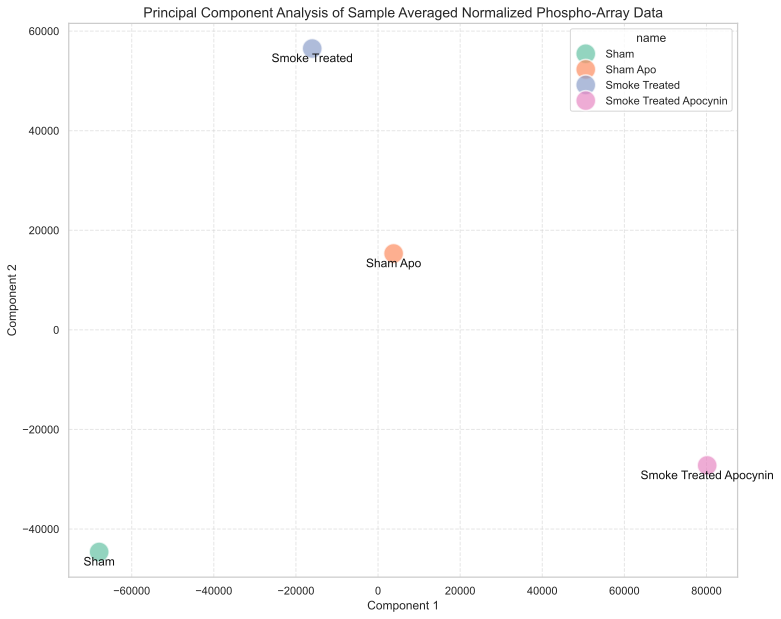

In [31]:
%config InlineBackend.figure_format = 'svg'

# Fit PCA
transformer = PCA(n_components=2)
transformed_result = transformer.fit_transform(average_normalised[~average_normalised.isna().any(axis=1)].T)

# Create a DataFrame for transformed results
transformed_df = pd.DataFrame(transformed_result, columns=['Component 1', 'Component 2'])
transformed_df['name'] = average_normalised.columns

# Set figure size and style
plt.figure(figsize=(12, 10))
sns.set(style="whitegrid")

# Create a scatterplot
sns.scatterplot(
    data=transformed_df, 
    x='Component 1', 
    y='Component 2', 
    s=400,            
    alpha=0.7,        
    hue=transformed_df['name'],  # Color by 'name'
    palette='Set2'    
)

# Label points with 'name' slightly off the dots
for i in range(len(transformed_df)):
    plt.text(transformed_df['Component 1'][i], 
             transformed_df['Component 2'][i] - 1000,  # Adjusted y-offset for better labeling
             transformed_df['name'][i], 
             fontsize=12, 
             ha='center', 
             va='top', 
             color='#121212')  # Darker text color for better visibility

# Set plot title and axis labels
plt.title('Principal Component Analysis of Sample Averaged Normalized Phospho-Array Data', fontsize=14)
plt.xlabel('Component 1', fontsize=12)
plt.ylabel('Component 2', fontsize=12)

plt.grid(linestyle='--', alpha=0.5)
plt.savefig(output_dir_figures + 'scatterplot_avg.png', dpi=600)
plt.show()

<Figure size 5000x4000 with 0 Axes>

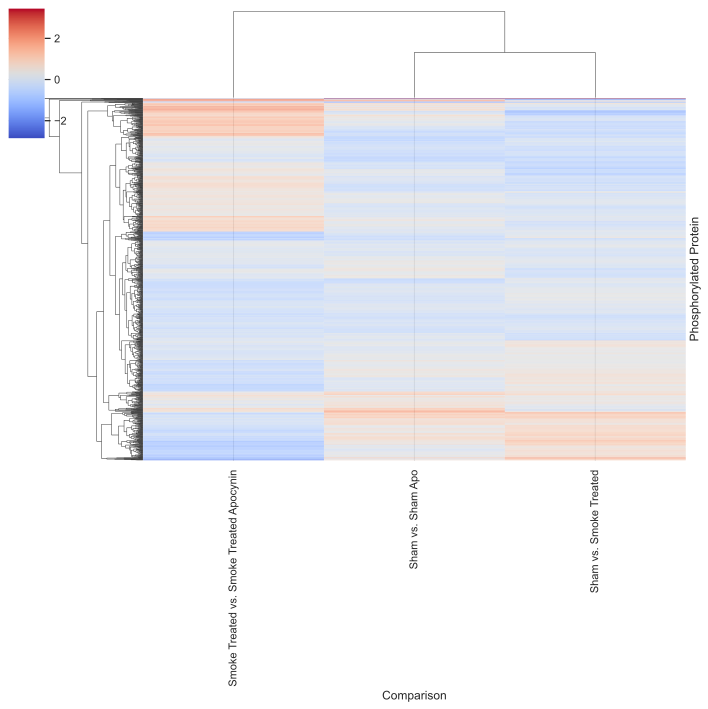

In [32]:
# Correcting the pivot function call by specifying arguments with keywords
exp_piv = (
    exp_df.groupby(["Comparison", "Title"])['log2fc']
    .mean()
    .reset_index()
    .pivot(index="Comparison", columns="Title", values="log2fc")
    .rename_axis("Phosphorylated Protein", axis=1)
)

# Generate the clustermap
plt.figure(figsize=(10, 8), dpi=500)
sns.clustermap(exp_piv.T, cmap='coolwarm', yticklabels=False, xticklabels=True)

plt.savefig(output_dir_figures + 'clustermap.png', dpi=600)
plt.show()


# 3. Go Analysis


In [33]:
# Create the output directory if it does not exist
output_dir = local_dir + 'goea_analysis'
os.makedirs(output_dir, exist_ok=True)

# Read the dataframe
final_df = exp_df

# Define the Uniprot ID column
uniprot_ids = 'Target Uniprot ID'

# List of comparisons
comparisons = ['Sham vs. Sham Apo', 'Smoke Treated vs. Smoke Treated Apocynin', 'Sham vs. Smoke Treated']

# In the df what is the column containing the log2 fold change values called
log2fc_col = 'log2fc'

quartiles = True
significant = 'significant'

# Initialize dictionaries to store results
goea_results = {}
goea_results_sig_top = {}
goea_results_sig_bottom = {}

# Perform GO analysis and save results
goea_results, goea_results_sig_top, goea_results_sig_bottom = perform_go_analysis(
    final_df,
    comparisons,
    output_dir,
    uniprot_ids,
    quartiles,
    log2fc_col,
    significant  # Correct variable name
)

# Merge results and create heatmap
merge_and_plot_heatmap(goea_results, comparisons, output_dir)


2024-10-05 14:06:03,416 - INFO - Initiating GOEA Analysis
2024-10-05 14:06:03,416 - INFO - Files already exist. Skipping download and decompression.
2024-10-05 14:06:03,419 - INFO - Successful download and decompression of gene2go.gz
2024-10-05 14:06:03,419 - INFO - go-basic.obo already exists. Skipping download.
2024-10-05 14:06:03,420 - INFO - Successful downloaded go.obo
2024-10-05 14:06:03,420 - INFO - Converting UniProt IDs: ['Q9UNI6', 'P42768', 'P27824', 'P51178', 'P63010', 'P06400', 'Q02763', 'Q06124', 'P30279', 'O00206', 'P50570', 'O14757', 'Q15262', 'Q15835', 'P55017', 'P42226', 'P29323', 'P53004', 'Q96Q40', 'Q86W92', 'P30556', 'P21359', 'Q9NWT6', 'Q07912', 'P13861', 'P18825', 'Q9NY27', 'P06239', 'P49327', 'P16591', 'Q16828', 'Q13177', 'Q9Y2X7', 'Q15700', 'P68366', 'Q02779', 'Q9Y6Q9', 'Q9Y4J8', 'P08575', 'Q16537', 'Q13202', 'Q9UKE5', 'P68104', 'Q53EU6', 'P32004', 'Q9NZL4', 'P53778', 'Q5VT25', 'Q9H2H9', 'Q99956', 'P43403', 'P43243', 'P18615', 'Q13233', 'P41145', 'Q05513', 'Q165

  EXISTS: gene2go
go.obo: fmt(1.2) rel(2024-06-17) 45,494 Terms
HMS:0:00:53.218128 347,845 annotations, 20,780 genes, 18,718 GOs, 1 taxids READ: gene2go 


2024-10-05 14:07:11,707 - INFO - input genes: 426



Load BP Ontology Enrichment Analysis ...
 99%  1,679 of  1,693 population items found in association

Load CC Ontology Enrichment Analysis ...
 99%  1,676 of  1,693 population items found in association

Load MF Ontology Enrichment Analysis ...
 99%  1,684 of  1,693 population items found in association


2024-10-05 14:07:14,132 - INFO - input genes: 424
2024-10-05 14:07:17,073 - INFO - GOEA Analysis completed.


   27 usr 142 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Sham_vs._Sham_Apo_goea_network_topBP.png
   22 usr  42 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Sham_vs._Sham_Apo_goea_network_topCC.png
   15 usr  44 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Sham_vs._Sham_Apo_goea_network_topMF.png
   46 usr 224 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Sham_vs._Sham_Apo_goea_network_bottomBP.png
   24 usr  53 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Sham_vs._Sham_Apo_goea_network_bottomCC.png


2024-10-05 14:07:22,158 - INFO - Initiating GOEA Analysis
2024-10-05 14:07:22,158 - INFO - Files already exist. Skipping download and decompression.
2024-10-05 14:07:22,159 - INFO - Successful download and decompression of gene2go.gz
2024-10-05 14:07:22,159 - INFO - go-basic.obo already exists. Skipping download.
2024-10-05 14:07:22,160 - INFO - Successful downloaded go.obo
2024-10-05 14:07:22,160 - INFO - Converting UniProt IDs: ['Q9UNI6', 'P42768', 'P27824', 'P51178', 'P63010', 'P06400', 'Q02763', 'Q06124', 'P30279', 'O00206', 'P50570', 'O14757', 'Q15262', 'Q15835', 'P55017', 'P42226', 'P29323', 'P53004', 'Q96Q40', 'Q86W92', 'P30556', 'P21359', 'Q9NWT6', 'Q07912', 'P13861', 'P18825', 'Q9NY27', 'P06239', 'P49327', 'P16591', 'Q16828', 'Q13177', 'Q9Y2X7', 'Q15700', 'P68366', 'Q02779', 'Q9Y6Q9', 'Q9Y4J8', 'P08575', 'Q16537', 'Q13202', 'Q9UKE5', 'P68104', 'Q53EU6', 'P32004', 'Q9NZL4', 'P53778', 'Q5VT25', 'Q9H2H9', 'Q99956', 'P43403', 'P43243', 'P18615', 'Q13233', 'P41145', 'Q05513', 'Q165

   24 usr  70 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Sham_vs._Sham_Apo_goea_network_bottomMF.png


2024-10-05 14:07:26,854 - INFO - Fetched: 500 / 821
2024-10-05 14:07:27,555 - INFO - Fetched: 821 / 821
2024-10-05 14:07:27,560 - INFO - Converting UniProt IDs: ['Q9UNI6', 'P06400', 'P50570', 'Q15262', 'O14757', 'Q15835', 'P55017', 'P42226', 'P29323', 'P21359', 'Q07912', 'P13861', 'P06239', 'P49327', 'P16591', 'Q16828', 'Q13177', 'Q15700', 'Q02779', 'Q9Y4J8', 'P08575', 'Q13202', 'P68104', 'P53778', 'Q5VT25', 'Q9H2H9', 'P43403', 'P43243', 'Q05513', 'Q16539', 'Q5TCY1', 'P35813', 'O15357', 'Q14814', 'P36507', 'Q15349', 'P55072', 'O75116', 'P51451', 'P09769', 'Q16555', 'P29475', 'P49759', 'P11362', 'P51610', 'Q08345', 'O15146', 'P04049', 'P00441', 'Q13315', 'P67775', 'P08247', 'Q96Q15', 'Q9Y2K2', 'P16104', 'O00763', 'Q9H0U4', 'Q13163', 'P48023', 'P22607', 'P08138', 'P60880', 'P10275', 'P27986', 'Q8N5S9', 'P48506', 'Q14289', 'P07947', 'P12931', 'O60566', 'Q16659', 'Q9HC35', 'Q9H2G2', 'Q9UF33', 'Q9H2X9', 'P00533', 'P21802', 'Q96J92', 'P50579', 'P57059', 'O15111', 'Q12959', 'P10276', 'Q06187'

  EXISTS: gene2go
go.obo: fmt(1.2) rel(2024-06-17) 45,494 Terms
HMS:0:00:54.070189 347,845 annotations, 20,780 genes, 18,718 GOs, 1 taxids READ: gene2go 


2024-10-05 14:08:31,377 - INFO - input genes: 423



Load BP Ontology Enrichment Analysis ...
 99%  1,679 of  1,693 population items found in association

Load CC Ontology Enrichment Analysis ...
 99%  1,676 of  1,693 population items found in association

Load MF Ontology Enrichment Analysis ...
 99%  1,684 of  1,693 population items found in association


2024-10-05 14:08:34,324 - INFO - input genes: 424
2024-10-05 14:08:36,841 - INFO - GOEA Analysis completed.


   43 usr 202 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Smoke_Treated_vs._Smoke_Treated_Apocynin_goea_network_topBP.png
   30 usr  55 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Smoke_Treated_vs._Smoke_Treated_Apocynin_goea_network_topCC.png
   22 usr  58 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Smoke_Treated_vs._Smoke_Treated_Apocynin_goea_network_topMF.png
   42 usr 172 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Smoke_Treated_vs._Smoke_Treated_Apocynin_goea_network_bottomBP.png
   20 usr  40 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Smoke_Treated_vs._Smoke_Treated_Apocynin_goea_network_bottomCC.png


2024-10-05 14:08:41,427 - INFO - Initiating GOEA Analysis
2024-10-05 14:08:41,427 - INFO - Files already exist. Skipping download and decompression.
2024-10-05 14:08:41,428 - INFO - Successful download and decompression of gene2go.gz
2024-10-05 14:08:41,429 - INFO - go-basic.obo already exists. Skipping download.
2024-10-05 14:08:41,429 - INFO - Successful downloaded go.obo
2024-10-05 14:08:41,430 - INFO - Converting UniProt IDs: ['Q9UNI6', 'P42768', 'P27824', 'P51178', 'P63010', 'P06400', 'Q02763', 'Q06124', 'P30279', 'O00206', 'P50570', 'O14757', 'Q15262', 'Q15835', 'P55017', 'P42226', 'P29323', 'P53004', 'Q96Q40', 'Q86W92', 'P30556', 'P21359', 'Q9NWT6', 'Q07912', 'P13861', 'P18825', 'Q9NY27', 'P06239', 'P49327', 'P16591', 'Q16828', 'Q13177', 'Q9Y2X7', 'Q15700', 'P68366', 'Q02779', 'Q9Y6Q9', 'Q9Y4J8', 'P08575', 'Q16537', 'Q13202', 'Q9UKE5', 'P68104', 'Q53EU6', 'P32004', 'Q9NZL4', 'P53778', 'Q5VT25', 'Q9H2H9', 'Q99956', 'P43403', 'P43243', 'P18615', 'Q13233', 'P41145', 'Q05513', 'Q165

   17 usr  47 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Smoke_Treated_vs._Smoke_Treated_Apocynin_goea_network_bottomMF.png


2024-10-05 14:08:45,726 - INFO - Fetched: 500 / 821
2024-10-05 14:08:46,365 - INFO - Fetched: 821 / 821
2024-10-05 14:08:46,370 - INFO - Converting UniProt IDs: ['P27824', 'P51178', 'P06400', 'Q06124', 'O14757', 'Q15835', 'P42226', 'Q96Q40', 'Q86W92', 'P30556', 'Q07912', 'P13861', 'P06239', 'P49327', 'P16591', 'Q13177', 'Q9Y2X7', 'P68366', 'P53778', 'Q99956', 'P43243', 'P18615', 'Q13233', 'P41145', 'Q05513', 'Q16539', 'Q99683', 'Q9UQ07', 'O15357', 'Q12824', 'P50548', 'P17096', 'P49137', 'P55072', 'O75116', 'Q12882', 'P09769', 'Q16555', 'Q7L591', 'P11362', 'P30307', 'P51610', 'P26045', 'Q08345', 'P04049', 'P00441', 'Q13315', 'P29466', 'P30519', 'P67775', 'P25774', 'Q96Q15', 'Q96RI1', 'P42685', 'Q9Y2K2', 'Q9H902', 'P35269', 'Q8N726', 'Q96C90', 'P19419', 'P22607', 'Q00653', 'P60880', 'Q8N2Q7', 'P27986', 'Q8N5S9', 'Q96BR1', 'P43405', 'Q14289', 'P07947', 'O15350', 'P12931', 'Q16659', 'Q9Y2I7', 'P06702', 'Q96MW5', 'Q96I34', 'P00533', 'Q9NQU5', 'O95835', 'Q96CW1', 'P57059', 'O15111', 'Q06187'

  EXISTS: gene2go
go.obo: fmt(1.2) rel(2024-06-17) 45,494 Terms
HMS:0:00:52.603856 347,845 annotations, 20,780 genes, 18,718 GOs, 1 taxids READ: gene2go 


2024-10-05 14:09:50,247 - INFO - input genes: 423



Load BP Ontology Enrichment Analysis ...
 99%  1,679 of  1,693 population items found in association

Load CC Ontology Enrichment Analysis ...
 99%  1,676 of  1,693 population items found in association

Load MF Ontology Enrichment Analysis ...
 99%  1,684 of  1,693 population items found in association


2024-10-05 14:09:52,973 - INFO - input genes: 426
2024-10-05 14:09:55,639 - INFO - GOEA Analysis completed.


   50 usr 229 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Sham_vs._Smoke_Treated_goea_network_topBP.png
   24 usr  44 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Sham_vs._Smoke_Treated_goea_network_topCC.png
   19 usr  50 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Sham_vs._Smoke_Treated_goea_network_topMF.png
   38 usr 193 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Sham_vs._Smoke_Treated_goea_network_bottomBP.png
   28 usr  59 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Sham_vs._Smoke_Treated_goea_network_bottomCC.png
   22 usr  61 GOs  WROTE: ./SmokeAnalysis/goea_analysis\Sham_vs._Smoke_Treated_goea_network_bottomMF.png


C:\Users\Jack\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\matrix.py:1124: UserWarning:

``square=True`` ignored in clustermap

C:\Users\Jack\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\matrix.py:1124: UserWarning:

``square=True`` ignored in clustermap

C:\Users\Jack\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\matrix.py:1124: UserWarning:

``square=True`` ignored in clustermap



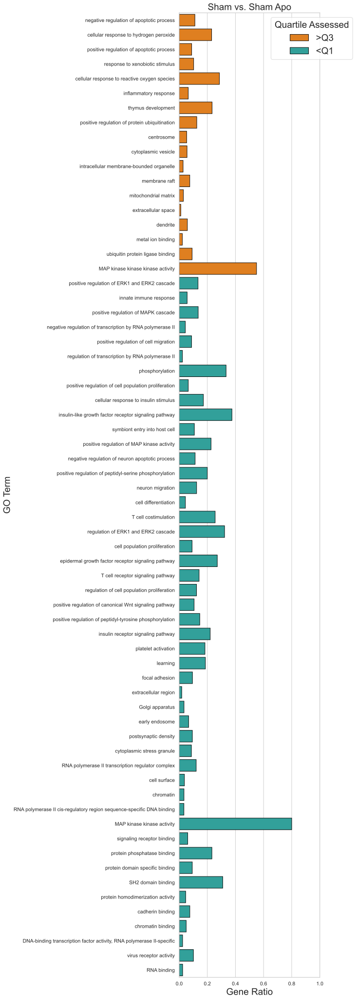

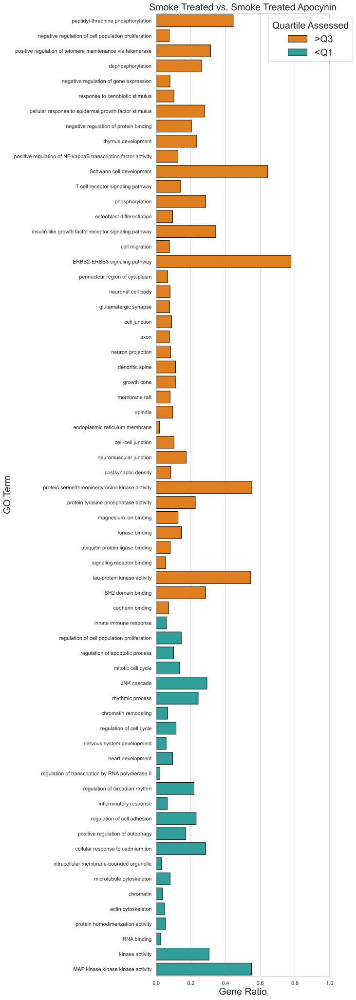

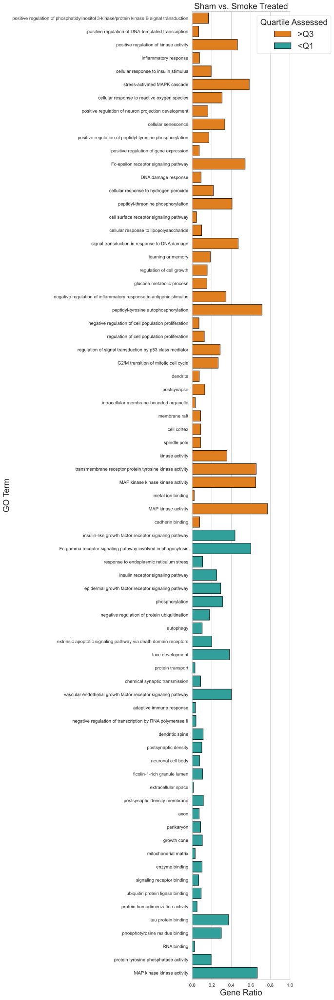

In [34]:
for comparison in goea_results.keys():
    barplot_GOEA_quartiles(
        dataset=goea_results[comparison],
        hue='study_pop_assessed',
        title=comparison
    )

# 4. Mappings

In [35]:
melted_original = pd.read_csv(os.path.join(output_dir_sheets, 'merged_data_all.csv'))

# Process dataset into required format for mappings ingestion
map_in_sham_apo = mappings_data_conformer(melted_original, 'Sham', 'Sham Apo')
map_in_smoke = mappings_data_conformer(melted_original, 'Sham', 'Smoke Treated')
map_in_apocynin = mappings_data_conformer(melted_original, 'Smoke Treated', 'Smoke Treated Apocynin')

In [36]:
NetConnections = pd.read_csv(output_dir_sheets + 'NetworkComplete.csv')

# Analysis criteria to set according to requirements
ErrorThreshold = 1  # Lower = more stringent (0.01 - 10 (above 1 not recommended, 1 = 1:1 total error to change)
LowSignalCutOff = 750  # Change to desired value, older arrays 1000 recommended, newer 750 recommended
PanNormaliser = False  # Do you want the phospho signals normalised by pan-signals?
walk_number = 1000000 # How many randomtrails to generate (standard = 1 million)
save_dir = 'SmokeAnalysis/MAPPINGS/Results/' 
walklength = 3

output_dir = 'MAPPINGS/Results'
os.makedirs(output_dir, exist_ok=True)

network_output_filename = 'mappings_sham_vs_sham_apo.csv'

process_microarray_data(map_in_sham_apo, NetConnections, network_output_filename, ErrorThreshold, 
                                            LowSignalCutOff, PanNormaliser, walk_number, save_dir, walklength)

network_output_filename = 'mappings_sham_vs_smoke_treated.csv'

process_microarray_data(map_in_smoke, NetConnections, network_output_filename,ErrorThreshold, 
                                            LowSignalCutOff, PanNormaliser, walk_number, save_dir, walklength)

network_output_filename = 'mappings_smoke_vs_smoke_apo.csv '

process_microarray_data(map_in_apocynin, NetConnections, network_output_filename, ErrorThreshold, 
                                            LowSignalCutOff, PanNormaliser, walk_number, save_dir, walklength)

Read this
Networks Setup: Successful
Positive Trail Analysis


Running Random Trails: 1000001walks [00:44, 22493.31walks/s]                         


Positive Trail Analysis (Control Data)


Running Random Trails: 1000001walks [00:46, 21572.26walks/s]                         


Negative Trail Analysis


Running Random Trails: 1000001walks [01:10, 14258.92walks/s]                         


Negative Trail Analysis (Control Data)


Running Random Trails: 1000001walks [01:07, 14890.03walks/s]                         


Walks: Completed
Trails Step Splitting and Tallying: Completed
Read this
Networks Setup: Successful
Positive Trail Analysis


Running Random Trails: 1000001walks [00:43, 23223.19walks/s]                         


Positive Trail Analysis (Control Data)


Running Random Trails: 1000001walks [00:47, 21052.62walks/s]                         


Negative Trail Analysis


Running Random Trails: 1000001walks [00:49, 20039.16walks/s]                         


Negative Trail Analysis (Control Data)


Running Random Trails: 1000001walks [00:54, 18431.04walks/s]                         


Walks: Completed
Trails Step Splitting and Tallying: Completed
Read this
Networks Setup: Successful
Positive Trail Analysis


Running Random Trails: 1000001walks [00:45, 22162.92walks/s]                         


Positive Trail Analysis (Control Data)


Running Random Trails: 1000001walks [05:33, 3000.67walks/s]                          


Negative Trail Analysis


Running Random Trails: 1000001walks [00:51, 19275.68walks/s]                         


Negative Trail Analysis (Control Data)


Running Random Trails: 1000001walks [00:53, 18753.23walks/s]                         


Walks: Completed
Trails Step Splitting and Tallying: Completed


In [37]:
NetConnections = pd.read_csv(output_dir_sheets + 'NetworkComplete.csv')
name_to_uniprot = dict(zip(NetConnections['Kinase'], NetConnections['Kinase_uniprot_ID']))
name_to_uniprot.update(dict(zip(NetConnections['Substrate'], NetConnections['Substrate_uniprot_ID'])))

# Initialize an empty dictionary to store the DataFrames
dataframes = {}

# Iterate over all files in the directory
for filename in os.listdir(local_dir +'MAPPINGS/Results/'):
    if filename.endswith('.csv'):
        file_path = os.path.join(local_dir +'MAPPINGS/Results/', filename)
        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)

        # Apply the mapping to 'Kinase' and 'Substrate' columns if they exist
        if 'Kinase' in df.columns:
            df['Kinase Uniprot'] = df['Kinase'].map(name_to_uniprot)
        if 'Substrate' in df.columns:
            df['Substrate Uniprot'] = df['Substrate'].map(name_to_uniprot)
            
        cols = ['Kinase', 'Kinase Uniprot', 'Substrate Uniprot', 'Substrate', 'Phosphosite', 'Substrate_effect', 'Change (%)']
        df = df[cols]

        # Use the filename without the extension as the key
        key = os.path.splitext(filename)[0]
        dataframes[key] = df

In [38]:
from functools import reduce
id_cols = ['Kinase', 'Kinase Uniprot', 'Substrate Uniprot', 'Substrate', 'Phosphosite', 'Substrate_effect']

dfs = []

# Iterate over the dictionary of DataFrames
for key, df in dataframes.items():

    df = df.copy()
    
    # Identify columns that are not in id_cols
    other_cols = [col for col in df.columns if col not in id_cols]
    
    # Rename these columns by appending the key as a suffix
    new_col_names = {col: f"{col}_{key}" for col in other_cols}
    df.rename(columns=new_col_names, inplace=True)
    
    # Add the modified DataFrame to the list
    dfs.append(df)

# Merge all DataFrames in the list on id_cols using an outer join
all_mappings_df = reduce(lambda left, right: pd.merge(left, right, on=id_cols, how='outer'), dfs)

In [39]:
non_mappings_data = pd.read_csv(output_dir_sheets + 'non_mappings_data.csv')

mappings_merged2 = all_mappings_df.merge(non_mappings_data, left_on=['Substrate Uniprot', 'Phosphosite'], 
                                         right_on=['Target Uniprot ID', 'Pan or P-Site'], how='outer')

mappings_merged2['Substrate Uniprot'] = mappings_merged2['Substrate Uniprot'].fillna(mappings_merged2['Target Uniprot ID'])
mappings_merged2['Phosphosite'] = mappings_merged2['Phosphosite'].fillna(mappings_merged2['Pan or P-Site'])
mappings_merged2['Substrate'] = mappings_merged2['Substrate'].fillna(mappings_merged2['Substrate Uniprot'])
mappings_merged2 = mappings_merged2.drop(columns=['Target Uniprot ID', 'Pan or P-Site'])

mappings_merged2 = mappings_merged2[~mappings_merged2[non_mappings_data.drop(columns=['Target Uniprot ID', 'Pan or P-Site']).columns].isna().all(axis=1)]
antibody_name_dict = dict(zip(antibody_to_uniprot['Antibody Code'], antibody_to_uniprot['Target Name']))
mappings_merged2['Substrate'] = mappings_merged2['antibody'].map(antibody_name_dict)
mappings_merged2[['antibody', 'Substrate Uniprot', 'Substrate', 'Phosphosite', 'Substrate_effect',
                  'mean Normalized Sham', 'mean Normalized Sham Apo', 'mean Normalized Smoke Treated',
                  'mean Normalized Smoke Treated Apocynin', 'error Normalized Sham',
                  'error Normalized Sham Apo', 'error Normalized Smoke Treated','error Normalized Smoke Treated Apocynin',
                  'log2fc Sham vs. Sham Apo', 'log2fc Sham vs. Smoke Treated', 'log2fc Smoke Treated vs. Smoke Treated Apocynin',
                  'pval Sham vs. Sham Apo', 'pval Sham vs. Smoke Treated', 'pval Smoke Treated vs. Smoke Treated Apocynin',
                  'significant Sham vs. Sham Apo', 'significant Sham vs. Smoke Treated',
                  'significant Smoke Treated vs. Smoke Treated Apocynin', 'Kinase', 'Kinase Uniprot', 'Change (%)_mappings_sham_vs_sham_apo',
                  'Change (%)_mappings_sham_vs_smoke_treated', 'Change (%)_mappings_smoke_vs_smoke_apo'
                  ]].to_csv(output_dir_sheets + 'mappings_smoke.csv', index=False)